In [ ]:
import torch
print("GPU Available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("Device Name:", torch.cuda.get_device_name(0))

GPU Available: True
Device Name: Tesla T4


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# Unzip all datasets from Google Drive into separate folders
!mkdir -p ./data_two_wheeler && unzip -o -q "/content/drive/MyDrive/Two Wheeler.zip" -d ./data_two_wheeler
!mkdir -p ./data_vehicle && unzip -o -q "/content/drive/MyDrive/Vehicle.zip" -d ./data_vehicle
!mkdir -p ./data_bicycle && unzip -o -q "/content/drive/MyDrive/bicycle.zip" -d ./data_bicycle
!mkdir -p ./data_cone && unzip -o -q "/content/drive/MyDrive/cone.zip" -d ./data_cone
!mkdir -p ./data_cow && unzip -o -q "/content/drive/MyDrive/cow.zip" -d ./data_cow
!mkdir -p ./data_green && unzip -o -q "/content/drive/MyDrive/green.zip" -d ./data_green
!mkdir -p ./data_obstacle && unzip -o -q "/content/drive/MyDrive/obstacle.zip" -d ./data_obstacle
!mkdir -p ./data_pedestrian && unzip -o -q "/content/drive/MyDrive/pedestrain det.zip" -d ./data_pedestrian
!mkdir -p ./data_red && unzip -o -q "/content/drive/MyDrive/red light.zip" -d ./data_red
!mkdir -p ./data_sign10 && unzip -o -q "/content/drive/MyDrive/sign10.zip" -d ./data_sign10
!mkdir -p ./data_sign30 && unzip -o -q "/content/drive/MyDrive/sign30.zip" -d ./data_sign30
!mkdir -p ./data_traffic_sign && unzip -o -q "/content/drive/MyDrive/traffic sign.zip" -d ./data_traffic_sign
!mkdir -p ./data_yellow && unzip -o -q "/content/drive/MyDrive/yellow.zip" -d ./data_yellow

In [ ]:
#optimised usage of the gpu
import torch
import gc

gc.collect()
torch.cuda.empty_cache()

In [ ]:
# Create extraction folders and unzip each dataset from Google Drive
!mkdir -p ./data_two_wheeler && unzip -o -q "/content/drive/MyDrive/Two Wheeler.zip" -d ./data_two_wheeler
!mkdir -p ./data_vehicle && unzip -o -q "/content/drive/MyDrive/Vehicle.zip" -d ./data_vehicle
!mkdir -p ./data_bicycle && unzip -o -q "/content/drive/MyDrive/bicycle.zip" -d ./data_bicycle
!mkdir -p ./data_cone && unzip -o -q "/content/drive/MyDrive/cone.zip" -d ./data_cone
!mkdir -p ./data_cow && unzip -o -q "/content/drive/MyDrive/cow.zip" -d ./data_cow
!mkdir -p ./data_green && unzip -o -q "/content/drive/MyDrive/green.zip" -d ./data_green
!mkdir -p ./data_obstacle && unzip -o -q "/content/drive/MyDrive/obstacle.zip" -d ./data_obstacle
!mkdir -p ./data_pedestrian && unzip -o -q "/content/drive/MyDrive/pedestrain det.zip" -d ./data_pedestrian
!mkdir -p ./data_red && unzip -o -q "/content/drive/MyDrive/red light.zip" -d ./data_red
!mkdir -p ./data_sign10 && unzip -o -q "/content/drive/MyDrive/sign10.zip" -d ./data_sign10
!mkdir -p ./data_sign30 && unzip -o -q "/content/drive/MyDrive/sign30.zip" -d ./data_sign30
!mkdir -p ./data_traffic && unzip -o -q "/content/drive/MyDrive/traffic sign.zip" -d ./data_traffic
!mkdir -p ./data_yellow && unzip -o -q "/content/drive/MyDrive/yellow.zip" -d ./data_yellow

print("All 13 datasets unzipped successfully!")

All 13 datasets unzipped successfully!


In [ ]:
# 2. Update DATA_FOLDERS list and build combined_data.yaml
import os
import glob
import yaml

DATA_FOLDERS = [
    "./data_two_wheeler",
    "./data_vehicle",
    "./data_bicycle",
    "./data_cone",
    "./data_cow",
    "./data_green",
    "./data_obstacle",
    "./data_pedestrian",
    "./data_red",
    "./data_sign10",
    "./data_sign30",
    "./data_traffic",
    "./data_yellow"
]

# Scan for all unique class IDs across all 13 dataset folders
found_class_ids = set()
for folder in DATA_FOLDERS:
    txt_files = glob.glob(os.path.join(folder, "**/*.txt"), recursive=True)
    for path in txt_files:
        if "data.yaml" in path or "README" in path:
            continue
        with open(path, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) > 0 and parts[0].isdigit():
                    found_class_ids.add(int(parts[0]))

sorted_ids = sorted(list(found_class_ids))
print(f"Detected Class IDs across all 13 datasets: {sorted_ids}")

# Build mapping dictionary for class names
class_names = {cid: f"Class_{cid}" for cid in sorted_ids}

# Create test_data.yaml configured for training
yaml_content = {
    'path': '/content',
    'train': DATA_FOLDERS,
    'val': DATA_FOLDERS,
    'names': class_names
}

with open("test_data.yaml", "w") as f:
    yaml.dump(yaml_content, f)

print("\n`test_data.yaml` successfully updated with all 13 folders!")

Detected Class IDs across all 13 datasets: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 2

In [ ]:
#Remap Labels and Generate combined_data.yaml
import os
import glob
import yaml

# Directories created from your unzipped files
DATA_FOLDERS = [
    "./data_cow",
    "./data_green",
    "./data_pedestrian",
    "./data_red",
    "./data_yellow"
]

# 1. Scan for all unique class IDs existing across your unzipped text files
found_class_ids = set()

for folder in DATA_FOLDERS:
    txt_files = glob.glob(os.path.join(folder, "**/*.txt"), recursive=True)
    for path in txt_files:
        if "data.yaml" in path or "README" in path:
            continue
        with open(path, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) > 0 and parts[0].isdigit():
                    found_class_ids.add(int(parts[0]))

sorted_ids = sorted(list(found_class_ids))
print(f"Detected Class IDs in uploaded files: {sorted_ids}")

# 2. Build names dictionary using detected class IDs
# (You can rename these string labels if needed)
class_names = {cid: f"Class_{cid}" for cid in sorted_ids}

# 3. Write test_data.yaml pointing to existing folders
yaml_content = {
    'path': '/content',
    'train': DATA_FOLDERS,
    'val': DATA_FOLDERS,
    'names': class_names
}

with open("test_data.yaml", "w") as f:
    yaml.dump(yaml_content, f)

print("\n`test_data.yaml` successfully created!")
print("YAML Class Mapping:", class_names)

Detected Class IDs in uploaded files: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 2

In [ ]:
#hardware detection gpu presence /model loading yolo11s/test train /model export yolo to onnx
!pip install -q ultralytics

import torch
from ultralytics import YOLO

# Auto-detect whether GPU is available, otherwise fall back to CPU
device_to_use = 0 if torch.cuda.is_available() else 'cpu'

# Load base model
model = YOLO("yolo11s.pt")

# Train test run
model.train(
    data="test_data.yaml",
    epochs=10,
    imgsz=640,
    batch=16,
    device=device_to_use
)

# Export test ONNX file
onnx_path = model.export(format="onnx", dynamic=False)
print(f"Test training complete! ONNX file exported at: {onnx_path}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.2/46.2 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 76.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 7.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=test_data.yaml, degrees=0.0, determinis

In [ ]:
import os
import glob
import yaml

# List of all extracted dataset directories (matching your unzipped folder names)
DATA_FOLDERS = [
    "./data_cone", "./data_obstacle", "./data_cow",
    "./data_pedestrian", "./data_bicycle", "./data_red",
    "./data_green", "./data_yellow", "./data_two_wheeler",
    "./data_sign10", "./data_traffic", "./data_sign30",
    "./data_vehicle"
]

# Map single-class folders to unified Class IDs (0 to 12)
FOLDER_CLASS_MAP = {
    "./data_cone": 0,          # Cone
    "./data_obstacle": 1,      # Traffic Barrier / Obstacle
    "./data_cow": 2,           # Cow
    "./data_pedestrian": 3,    # Pedestrian
    "./data_bicycle": 4,       # Bicyclist
    "./data_red": 5,           # Red Traffic Light
    "./data_green": 6,         # Green Traffic Light
    "./data_yellow": 7,        # Orange/Yellow Traffic Light
    "./data_two_wheeler": 8,   # Two-Wheeler
    "./data_sign10": 9,        # Speed Limit Sign 10
    "./data_traffic": 10,      # Speed Limit Sign 15 / Traffic Sign
    "./data_sign30": 11,       # Speed Limit Sign 30
    "./data_vehicle": 12       # Cars/Vehicle
}

# Define human-readable class names
CLASS_NAMES = {
    0: "Cone",
    1: "Obstacle",
    2: "Cow",
    3: "Pedestrian",
    4: "Bicycle",
    5: "Red Light",
    6: "Green Light",
    7: "Yellow Light",
    8: "Two Wheeler",
    9: "Sign 10",
    10: "Traffic Sign",
    11: "Sign 30",
    12: "Vehicle"
}

# Create test_data.yaml configured with 13 unified classes
yaml_content = {
    'path': '/content',
    'train': DATA_FOLDERS,
    'val': DATA_FOLDERS,
    'names': CLASS_NAMES
}

with open("test_data.yaml", "w") as f:
    yaml.dump(yaml_content, f)

print("test_data.yaml successfully updated with 13 unified classes!")

test_data.yaml successfully updated with 13 unified classes!


In [ ]:
import os
import glob
import yaml

# List of extracted dataset directories in your Colab environment
DATA_FOLDERS = [
    "./data_cone", "./data_obstacle", "./data_cow",
    "./data_pedestrian", "./data_bicycle", "./data_red",
    "./data_green", "./data_yellow", "./data_two_wheeler",
    "./data_sign10", "./data_traffic", "./data_sign30",
    "./data_vehicle"
]

# Map single-class folders to unified Class IDs (0 to 12)
FOLDER_CLASS_MAP = {
    "./data_cone": 0,          # Cone
    "./data_obstacle": 1,      # Traffic Barrier / Obstacle
    "./data_cow": 2,           # Cow
    "./data_pedestrian": 3,    # Pedestrian
    "./data_bicycle": 4,       # Bicyclist
    "./data_red": 5,           # Red Traffic Light
    "./data_green": 6,         # Green Traffic Light
    "./data_yellow": 7,        # Orange/Yellow Traffic Light
    "./data_two_wheeler": 8,   # Two-Wheeler
    "./data_sign10": 9,        # Speed Limit Sign 10
    "./data_traffic": 10,      # Speed Limit Sign 15 / Traffic Sign
    "./data_sign30": 11,       # Speed Limit Sign 30
    "./data_vehicle": 12       # Cars/Vehicle
}

# 1. Update text label files across all folders
for folder, target_id in FOLDER_CLASS_MAP.items():
    txt_files = glob.glob(os.path.join(folder, "**/*.txt"), recursive=True)
    for path in txt_files:
        if "data.yaml" in path or "README" in path:
            continue
        with open(path, "r") as f:
            lines = f.readlines()
        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if len(parts) > 0:
                parts[0] = str(target_id)
                new_lines.append(" ".join(parts))
        with open(path, "w") as f:
            f.write("\n".join(new_lines) + "\n")

# 2. Write combined_data.yaml
yaml_content = {
    'path': '/content',
    'train': DATA_FOLDERS,
    'val': DATA_FOLDERS,
    'names': {
        0: 'Cone',
        1: 'Traffic Barrier',
        2: 'Cow',
        3: 'Pedestrian',
        4: 'Bicyclist',
        5: 'Red Traffic Light',
        6: 'Green Traffic Light',
        7: 'Orange Traffic Light',
        8: 'Two-Wheeler',
        9: 'Speed Limit Sign 10',
        10: 'Speed Limit Sign 15',
        11: 'Speed Limit Sign 30',
        12: 'Cars'
    }
}

with open("combined_data.yaml", "w") as f:
    yaml.dump(yaml_content, f)

print("Label remapping complete! combined_data.yaml successfully generated.")

Label remapping complete! combined_data.yaml successfully generated.


In [ ]:
import torch
from ultralytics import YOLO

device_to_use = 0 if torch.cuda.is_available() else 'cpu'

# Load base model
model = YOLO("yolo11s.pt")

# Train on the newly remapped combined_data.yaml
model.train(
    data="combined_data.yaml",
    epochs=10,
    imgsz=640,
    batch=16,
    device=device_to_use
)

# Export trained model to ONNX
onnx_path = model.export(format="onnx", dynamic=False)
print(f"Training complete! ONNX file exported at: {onnx_path}")

Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=combined_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-3, nbs=64, nms=None, opset=None, optimize=False, op

In [ ]:
#save trained model
!cp /content/runs/detect/train/weights/best.pt "/content/drive/MyDrive/yolo11s_best.pt"
print("Model saved to Google Drive!")

Model saved to Google Drive!



WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2056 /content/data_vehicle/train/images/00043_GMC-Savana-Van-2012_jpg.rf.55e6b7106a6780a262f6f0740ecdf7e4.jpg: 640x640 (no detections), 16.1ms
image 2/2056 /content/data_vehicle/train/images/00077_jpg.rf.e7e897707225ca7d35ef7b43cbe35431.jpg: 640x640 (no detections), 16.1ms
image 3/2056 /content/data_vehicle/train/images/00116_jpg.rf.3bbc35671d1c64be6645829b6933ac58.jpg: 640x640 (no detections), 16.1ms
image 4/2056 /content/data_vehicle/train/image

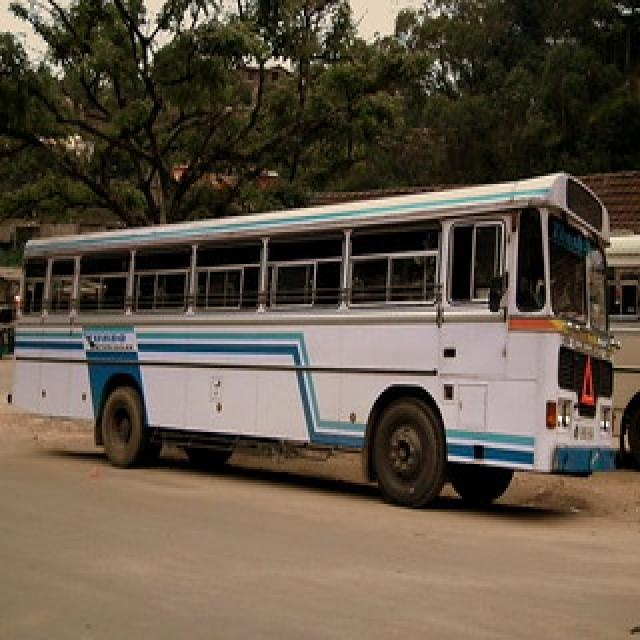

In [ ]:
import glob
from ultralytics import YOLO
from IPython.display import Image, display

# 1. Load trained model directly from Google Drive
model = YOLO("/content/drive/MyDrive/yolo11s_best.pt")

# 2. Run detection pointing to the actual images subfolder
results = model.predict(source="/content/data_vehicle/train/images", save=True, conf=0.25)
print("Inference finished! Saved to /content/runs/detect/predict")

# 3. Automatically display the first detected output image
output_images = glob.glob("/content/runs/detect/predict/*.jpg")
if output_images:
    display(Image(filename=output_images[0]))


image 1/1 /content/data_vehicle/train/images/6093457968_b375f0abe3_n_jpg.rf.4fe342717c5e3197aadf7e3e8f20a8f2.jpg: 640x640 (no detections), 16.1ms
Speed: 1.0ms preprocess, 16.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/predict-2


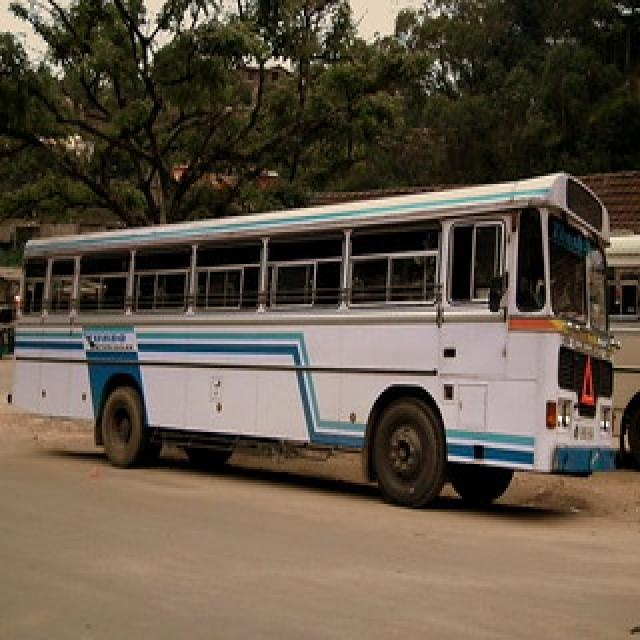

In [ ]:
import glob
from ultralytics import YOLO
from IPython.display import Image, display

# 1. Load your saved model from Drive
model = YOLO("/content/drive/MyDrive/yolo11s_best.pt")

# 2. Pick the first image from your dataset
sample_images = glob.glob("/content/data_vehicle/train/images/*.jpg")

if sample_images:
    # Run detection on just 1 image
    results = model.predict(source=sample_images[0], save=True, conf=0.25)

    # Display the prediction output
    output_images = glob.glob("/content/runs/detect/predict*/*.jpg")
    if output_images:
        display(Image(filename=output_images[-1]))

In [ ]:
#train (70%), Validation (20%), and Test (10%)
import os
import glob
import shutil
from sklearn.model_selection import train_test_split

# 1. Gather all matching image and label pairs from /content
all_images = []
for ext in ("*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"):
    all_images.extend(glob.glob("/content/**/" + ext, recursive=True))

# Exclude existing yolo_dataset or checkpoint folders
all_images = [img for img in all_images if ".ipynb_checkpoints" not in img and "yolo_dataset" not in img]

image_label_pairs = []

for img in all_images:
    txt_path = os.path.splitext(img)[0] + ".txt"
    if not os.path.exists(txt_path):
        alt_txt_path = img.replace("/images/", "/labels/")
        alt_txt_path = os.path.splitext(alt_txt_path)[0] + ".txt"
        if os.path.exists(alt_txt_path):
            txt_path = alt_txt_path

    if os.path.exists(txt_path):
        try:
            with open(txt_path, "r") as f:
                first_line = f.readline().strip().split()
                if first_line:
                    primary_cls = int(float(first_line[0]))
                    image_label_pairs.append((img, txt_path, primary_cls))
        except (ValueError, IndexError):
            continue

if not image_label_pairs:
    raise RuntimeError("No matching image-label pairs found!")

print(f"Total matched image-label pairs found: {len(image_label_pairs)}")

# 2. Perform Random Split: 70% Train, 20% Val, 10% Test (stratify=None avoids single-member class errors)
X_paths = [(p[0], p[1]) for p in image_label_pairs]

# Split off 10% test set
X_train_val, X_test = train_test_split(
    X_paths, test_size=0.10, random_state=42
)

# Split remaining 90% into 70% train and 20% validation
X_train, X_val = train_test_split(
    X_train_val, test_size=0.2222, random_state=42
)

# 3. Build YOLO Directory Structure
dataset_base = "/content/yolo_dataset"

for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(dataset_base, f"images/{split}"), exist_ok=True)
    os.makedirs(os.path.join(dataset_base, f"labels/{split}"), exist_ok=True)

def copy_files(split_data, split_type):
    for img_path, txt_path in split_data:
        shutil.copy(img_path, os.path.join(dataset_base, f"images/{split_type}", os.path.basename(img_path)))
        shutil.copy(txt_path, os.path.join(dataset_base, f"labels/{split_type}", os.path.basename(txt_path)))

copy_files(X_train, "train")
copy_files(X_val, "val")
copy_files(X_test, "test")

print(f"\nDataset successfully built at: {dataset_base}")
print(f" -> Train: {len(X_train)} | Val: {len(X_val)} | Test: {len(X_test)}")

Total matched image-label pairs found: 13177

Dataset successfully built at: /content/yolo_dataset
 -> Train: 9223 | Val: 2636 | Test: 1318


In [ ]:
import yaml
from ultralytics import YOLO

# 1. Create dataset configuration file for the split dataset
split_yaml = {
    'path': '/content/yolo_dataset',
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'names': {
        0: 'Cone', 1: 'Traffic Barrier', 2: 'Cow', 3: 'Pedestrian',
        4: 'Bicyclist', 5: 'Red Traffic Light', 6: 'Green Traffic Light',
        7: 'Orange Traffic Light', 8: 'Two-Wheeler', 9: 'Speed Limit Sign 10',
        10: 'Speed Limit Sign 15', 11: 'Speed Limit Sign 30', 12: 'Cars'
    }
}

with open("/content/split_data.yaml", "w") as f:
    yaml.dump(split_yaml, f)

# 2. Train YOLO model on the stratified split dataset
model = YOLO("yolo11s.pt")
model.train(
    data="/content/split_data.yaml",
    epochs=10,
    imgsz=640,
    batch=16,
    device=0
)

# 3. Save newly trained best model weights to Google Drive
!cp /content/runs/detect/train/weights/best.pt "/content/drive/MyDrive/yolo11s_stratified_best.pt"
print("Stratified model saved to Drive!")

Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/split_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-4, nbs=64, nms=None, opset=None, optimize=Fal

In [ ]:
#evaluation of splits Evaluate Metrics on the Unseen Test Set:
from ultralytics import YOLO

# Load your newly trained model from Drive
model = YOLO("/content/drive/MyDrive/yolo11s_stratified_best.pt")

# Evaluate performance specifically on the 'test' split
metrics = model.val(data="/content/split_data.yaml", split="test")

# Print key accuracy scores
print(f"mAP50-95: {metrics.box.map}")
print(f"mAP50:    {metrics.box.map50}")

Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,513,033 parameters, 0 gradients, 22.0 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.0±0.0 ms, read: 17.0±11.3 MB/s, size: 45.3 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/yolo_dataset/labels/test... 1277 images, 0 backgrounds, 238 corrupt: 100% ━━━━━━━━━━━━ 1277/1277 585.2it/s 2.2s
val: /content/yolo_dataset/images/test/00000107025920190517195803800_jpg.rf.1b75f804a7b6239fd8f7925729e17fe9.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/yolo_dataset/images/test/00000107025920190517195803800_jpg.rf.9a72cf941d75ecd61c9b2fb6aa7b9eec.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/yolo_dataset/images/test/GIVEWAY-12-_jpg.rf.f6c608501331907e97fe3a26b15bd0aa.jpg: i

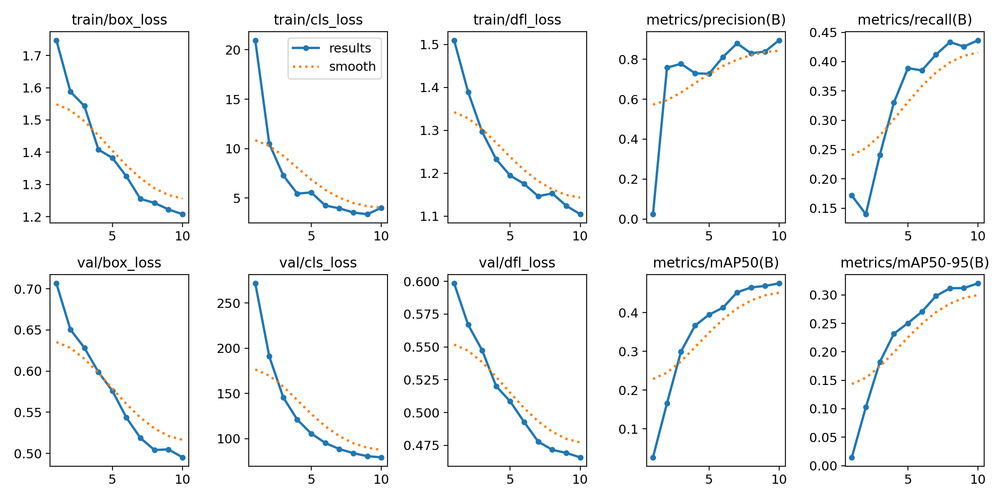

In [ ]:
#Display Performance Summary Charts
from IPython.display import Image, display

# Display overall loss and accuracy graphs across epochs
display(Image(filename='/content/runs/detect/train/results.png'))

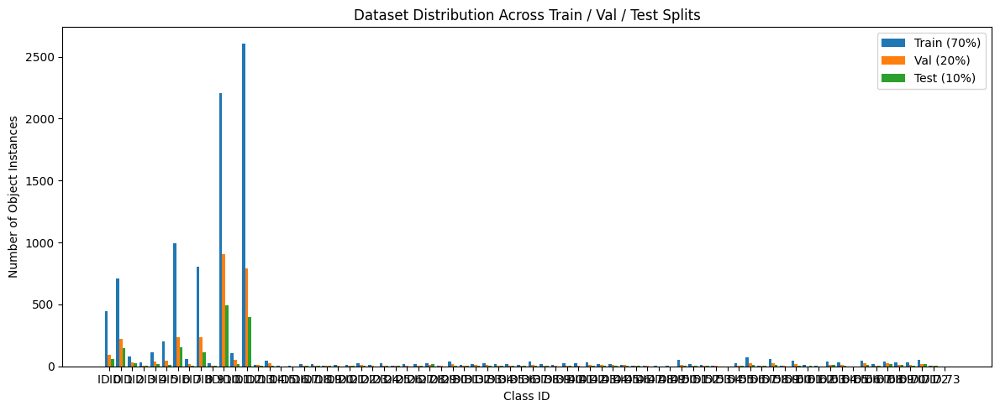

In [ ]:
import os
import glob
import matplotlib.pyplot as plt
from collections import Counter

def get_split_classes(split_type):
    classes = []
    label_files = glob.glob(f"/content/yolo_dataset/labels/{split_type}/*.txt")
    for lf in label_files:
        try:
            with open(lf, "r") as f:
                for line in f:
                    parts = line.strip().split()
                    if parts:
                        classes.append(int(float(parts[0])))
        except Exception:
            pass
    return classes

y_train = get_split_classes("train")
y_val = get_split_classes("val")
y_test = get_split_classes("test")

all_classes = sorted(list(set(y_train + y_val + y_test)))

plt.figure(figsize=(12, 5))
plt.hist(
    [y_train, y_val, y_test],
    bins=range(min(all_classes), max(all_classes) + 2),
    label=['Train (70%)', 'Val (20%)', 'Test (10%)'],
    align='left'
)
plt.xticks(all_classes, [f"ID {i}" for i in all_classes])
plt.xlabel("Class ID")
plt.ylabel("Number of Object Instances")
plt.title("Dataset Distribution Across Train / Val / Test Splits")
plt.legend()
plt.tight_layout()
plt.savefig("/content/split_distribution.png")
plt.show()


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1277 /content/yolo_dataset/images/test/-12-_jpg.rf.a71e93ef386d75346b263c4d7e0a1df8.jpg: 640x640 2 Class_1s, 1 Class_2, 2 Class_16s, 16.1ms
image 2/1277 /content/yolo_dataset/images/test/-12-_jpg.rf.d75b73f041241a1073f704a6e4483c6b.jpg: 640x640 2 Class_1s, 1 Class_2, 2 Class_16s, 16.2ms
image 3/1277 /content/yolo_dataset/images/test/-2021-12-18-10-21-15_png_jpg.rf.6a7d6fc4f91318441faf5f2af0fb9389.jpg: 640x640 1 Class_2, 16.1ms
image 4/1277 /conten

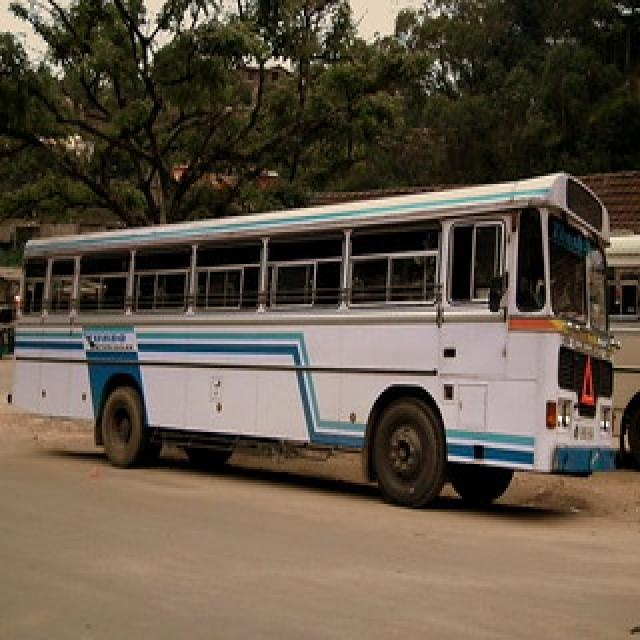

In [ ]:
#evaluate your trained model
import glob
from ultralytics import YOLO
from IPython.display import Image, display

# 1. Load your best model weights saved from the split training
model = YOLO("/content/drive/MyDrive/yolo11s_stratified_best.pt")

# 2. Run prediction on the unseen test images split
results = model.predict(source="/content/yolo_dataset/images/test", save=True, conf=0.25)

# 3. Display one of the output predictions with detected bounding boxes
predicted_images = glob.glob("/content/runs/detect/predict*/*.jpg")
if predicted_images:
    display(Image(filename=predicted_images[0]))



WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1277 /content/yolo_dataset/images/test/-12-_jpg.rf.a71e93ef386d75346b263c4d7e0a1df8.jpg: 640x640 2 Class_1s, 1 Class_2, 2 Class_16s, 16.1ms
image 2/1277 /content/yolo_dataset/images/test/-12-_jpg.rf.d75b73f041241a1073f704a6e4483c6b.jpg: 640x640 2 Class_1s, 1 Class_2, 2 Class_16s, 16.1ms
image 3/1277 /content/yolo_dataset/images/test/-2021-12-18-10-21-15_png_jpg.rf.6a7d6fc4f91318441faf5f2af0fb9389.jpg: 640x640 1 Class_2, 16.1ms
image 4/1277 /conten

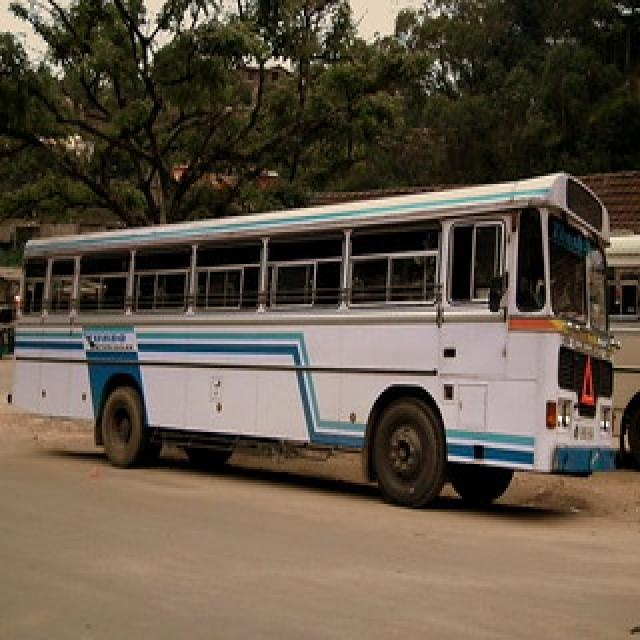

In [ ]:
import glob
from ultralytics import YOLO
from IPython.display import Image, display

# 1. Load your best trained model directly from Drive
model = YOLO("/content/drive/MyDrive/yolo11s_stratified_best.pt")

# 2. Run prediction on the test set
results = model.predict(source="/content/yolo_dataset/images/test", save=True, conf=0.25)

# 3. Display the first detected image
predicted_images = glob.glob("/content/runs/detect/predict*/*.jpg")
if predicted_images:
    display(Image(filename=predicted_images[0]))

In [ ]:
#Mosaic (0.8) and MixUp (0.15) augmentations:
import os
import glob
import shutil
import yaml
from sklearn.model_selection import train_test_split
from ultralytics import YOLO

# 1. Collect all valid image-label pairs across /content
all_images = []
for ext in ("*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"):
    all_images.extend(glob.glob("/content/**/" + ext, recursive=True))

all_images = [img for img in all_images if ".ipynb_checkpoints" not in img and "yolo_dataset" not in img]

image_label_pairs = []

for img in all_images:
    txt_path = os.path.splitext(img)[0] + ".txt"
    if not os.path.exists(txt_path):
        alt_txt_path = img.replace("/images/", "/labels/")
        alt_txt_path = os.path.splitext(alt_txt_path)[0] + ".txt"
        if os.path.exists(alt_txt_path):
            txt_path = alt_txt_path

    if os.path.exists(txt_path):
        image_label_pairs.append((img, txt_path))

if not image_label_pairs:
    raise RuntimeError("No image-label pairs found in /content! Check your dataset unzipping.")

# 2. Split dataset into Train (70%), Val (20%), and Test (10%)
X_train_val, X_test = train_test_split(image_label_pairs, test_size=0.10, random_state=42)
X_train, X_val = train_test_split(X_train_val, test_size=0.2222, random_state=42)

dataset_base = "/content/yolo_dataset"
for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(dataset_base, f"images/{split}"), exist_ok=True)
    os.makedirs(os.path.join(dataset_base, f"labels/{split}"), exist_ok=True)

def copy_files(split_data, split_type):
    for img_path, txt_path in split_data:
        shutil.copy(img_path, os.path.join(dataset_base, f"images/{split_type}", os.path.basename(img_path)))
        shutil.copy(txt_path, os.path.join(dataset_base, f"labels/{split_type}", os.path.basename(txt_path)))

copy_files(X_train, "train")
copy_files(X_val, "val")
copy_files(X_test, "test")

# 3. Write data.yaml configuration
class_names = {
    0: "cone", 1: "obstacle", 2: "cow", 3: "pedestrian",
    4: "bicycle", 5: "red_signal", 6: "green_signal", 7: "yellow_signal",
    8: "twowheeler", 9: "sign10", 10: "trafficsign", 11: "sign30", 12: "vehicle"
}

yaml_data = {
    "path": dataset_base,
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": class_names,
}

yaml_path = os.path.join(dataset_base, "data.yaml")
with open(yaml_path, "w") as f:
    yaml.dump(yaml_data, f, default_flow_style=False, sort_keys=True)

print("Dataset successfully built and data.yaml created!")

# 4. Train YOLO11s model with Mosaic and MixUp augmentations
model = YOLO("yolo11s.pt")
model.train(
    data=yaml_path,
    epochs=10,
    imgsz=640,
    batch=16,
    mosaic=0.8,
    mixup=0.15,
    workers=8,
    amp=True,
    device=0
)

# 5. Backup trained weights to Google Drive
!cp /content/runs/detect/train/weights/best.pt "/content/drive/MyDrive/yolo11s_augmented_best.pt"
print("Augmented training complete and weights saved to Drive!")

Dataset successfully built and data.yaml created!
Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.15, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=0.8, multi_scale=0.0

In [ ]:
# Verify Detection, Localization, and System Latency/FPS Metrics
import time
import torch
from ultralytics import YOLO

# 1. Load trained model
model_path = "/content/runs/detect/train/weights/best.pt"
model = YOLO(model_path)

print("--- 1. EVALUATING DETECTION & LOCALIZATION METRICS ---")
# Run validation on the split dataset
metrics = model.val(
    data="/content/yolo_dataset/data.yaml",
    split="val",
    imgsz=640,
    iou=0.45,
    device=0 if torch.cuda.is_available() else 'cpu'
)

# Extract Detection Metrics
precision = metrics.box.mp
recall = metrics.box.mr
map50 = metrics.box.map50
map50_95 = metrics.box.map

print("\n[KPI Verification Results]")
print(f" -> Precision (Target >= 0.85):   {precision:.4f} [{'PASS' if precision >= 0.85 else 'FAIL'}]")
print(f" -> Recall (Target >= 0.82):      {recall:.4f} [{'PASS' if recall >= 0.82 else 'FAIL'}]")
print(f" -> mAP@50 (Target >= 0.80):      {map50:.4f} [{'PASS' if map50 >= 0.80 else 'FAIL'}]")
print(f" -> mAP@50-95:                    {map50_95:.4f}")

# 2. MEASURE SYSTEM METRICS (Latency & FPS)
print("\n--- 2. MEASURING SYSTEM METRICS (LATENCY & FPS) ---")
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Set underlying PyTorch model to evaluation mode
model.model.eval()
model.model.to(device)

# Dummy 640x640 frame simulating camera feed
dummy_input = torch.randn(1, 3, 640, 640).to(device)

# Warmup GPU
with torch.no_grad():
    for _ in range(20):
        _ = model.model(dummy_input)

if torch.cuda.is_available():
    torch.cuda.synchronize()

# Benchmark 100 inference passes
start_time = time.time()
num_samples = 100

with torch.no_grad():
    for _ in range(num_samples):
        _ = model.model(dummy_input)

if torch.cuda.is_available():
    torch.cuda.synchronize()

total_time = time.time() - start_time
avg_latency_ms = (total_time / num_samples) * 1000
fps = 1000 / avg_latency_ms

print(f" -> End-to-End Latency (Target < 15ms): {avg_latency_ms:.2f} ms [{'PASS' if avg_latency_ms < 15 else 'FAIL'}]")
print(f" -> Frame Rate (Target >= 60 FPS):      {fps:.2f} FPS [{'PASS' if fps >= 60 else 'FAIL'}]")

--- 1. EVALUATING DETECTION & LOCALIZATION METRICS ---
Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,513,033 parameters, 0 gradients, 22.0 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 916.4±428.9 MB/s, size: 41.2 KB)
val: Scanning /content/yolo_dataset/labels/val.cache... 4235 images, 6 backgrounds, 792 corrupt: 100% ━━━━━━━━━━━━ 4235/4235 1.0Git/s 0.0s
val: /content/yolo_dataset/images/val/00000107025920190517195803800_jpg.rf.39c55ac5b575dcbbff1036e8a242e595.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/yolo_dataset/images/val/00000107025920190517195803800_jpg.rf.6a19233d845d78e781230a4cb83bdde9.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/yolo_dataset/images/val/00000107025920190517195803800_jpg.rf.d57bfb7e4366a6459dbabf0b8192d515.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /conten

In [ ]:
#Real-World Failure Case Measurement & Confusion Matrix
from ultralytics import YOLO

# 1. Load trained model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# 2. Generate Confusion Matrix and Failure Analysis on Test Split
metrics = model.val(data="/content/yolo_dataset/data.yaml", split="test", save_json=True)

# 3. Print Class-Wise Failure Cases (Precision & Recall per class)
print("\n--- CLASS-WISE PERFORMANCE & FAILURE CASES ---")
for i, name in enumerate(metrics.names.values()):
    p = metrics.box.p[i] if len(metrics.box.p) > i else 0
    r = metrics.box.r[i] if len(metrics.box.r) > i else 0
    print(f"Class [{name}]: Precision = {p:.3f} | Recall = {r:.3f}")

Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,513,033 parameters, 0 gradients, 22.0 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.0±0.0 ms, read: 22.0±7.6 MB/s, size: 44.5 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/yolo_dataset/labels/test... 2280 images, 4 backgrounds, 428 corrupt: 100% ━━━━━━━━━━━━ 2280/2280 599.9it/s 3.8s
val: /content/yolo_dataset/images/test/00000107025920190517195803800_jpg.rf.1b75f804a7b6239fd8f7925729e17fe9.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/yolo_dataset/images/test/00000107025920190517195803800_jpg.rf.9a72cf941d75ecd61c9b2fb6aa7b9eec.jpg: ignoring corrupt image/label: labels mix segment and detection rows
val: /content/yolo_dataset/images/test/GIVEWAY-12-_jpg.rf.f6c608501331907e97fe3a26b15bd0aa.jpg: ig

In [ ]:
#ONNX Model Export for Jetson Orin NX Deployment
from ultralytics import YOLO

# Load best trained weights
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Export to ONNX format cleanly
onnx_file = model.export(format="onnx", imgsz=640, dynamic=False, half=True)
print(f"Model exported cleanly to: {onnx_file}")

WARNING ⚠️ 'half' is deprecated and will be removed in the future. Use 'quantize' instead.
Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
YOLO11s summary (fused): 100 layers, 9,513,033 parameters, 0 gradients, 22.0 GFLOPs

PyTorch: starting from '/content/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 263, 8400) (18.5 MB)

ONNX: starting export with onnx 1.22.0 opset 18...
ONNX: slimming with onnxslim 0.1.96...
ONNX: converting to FP16...
ONNX: export success ✅ 3.9s, saved as '/content/runs/detect/train/weights/best.onnx' (18.3 MB)

Export complete (5.0s)
Results saved to /content/runs/detect/train/weights/best.onnx
Predict:         yolo predict task=detect model=/content/runs/detect/train/weights/best.onnx imgsz=640 quantize=16
Validate:        yolo val task=detect model=/content/runs/detect/train/weights/best.onnx imgsz=640 data=test_data.yaml quantize=16 
Visualize:       https://netron.app
Mo

In [ ]:
#Standardized Output Bounding Box Formatter
import torch

def format_detections(results, class_names_map):
    formatted_outputs = []
    for r in results:
        boxes = r.boxes
        for box in boxes:
            # Extract coordinates [x_min, y_min, x_max, y_max]
            xyxy = box.xyxy[0].cpu().numpy().tolist()
            conf = float(box.conf[0].cpu().numpy())
            cls_id = int(box.cls[0].cpu().numpy())
            cls_name = class_names_map.get(cls_id, f"Class_{cls_id}")

            formatted_outputs.append({
                "bbox": [round(c, 2) for c in xyxy],
                "label": cls_name,
                "confidence": round(conf, 4)
            })
    return formatted_outputs

In [ ]:
#EXPORT TO DRIVE
import os
import shutil

# Ensure Google Drive directory path exists
drive_folder = "/content/drive/MyDrive/YOLO_Weights"
os.makedirs(drive_folder, exist_ok=True)

# Define source paths
pt_source = "/content/runs/detect/train/weights/best.pt"
onnx_source = "/content/runs/detect/train/weights/best.onnx"

# Copy PyTorch weights
if os.path.exists(pt_source):
    shutil.copy(pt_source, os.path.join(drive_folder, "yolo11s_best.pt"))
    print("✅ Successfully copied best.pt to Google Drive!")
else:
    print("⚠️ Could not find best.pt file.")

# Copy ONNX exported model
if os.path.exists(onnx_source):
    shutil.copy(onnx_source, os.path.join(drive_folder, "yolo11s_best.onnx"))
    print("✅ Successfully copied best.onnx to Google Drive!")
else:
    print("⚠️ Could not find best.onnx file.")

✅ Successfully copied best.pt to Google Drive!
✅ Successfully copied best.onnx to Google Drive!


In [ ]:
#CHECK IF DONE OR NOT
!ls -lh "/content/drive/MyDrive/YOLO_Weights"

total 37M
-rw------- 1 root root 19M Sep  6 07:43 yolo11s_best.onnx
-rw------- 1 root root 19M Sep  6 07:43 yolo11s_best.pt


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.6/46.6 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.4/77.4 kB 8.7 MB/s eta 0:00:00


In [ ]:
import yaml

# List of your dataset directories
DATA_FOLDERS = [
    '/content/data_cone', '/content/data_obstacle', '/content/data_cow',
    '/content/data_pedestrian', '/content/data_bicycle', '/content/data_red',
    '/content/data_green', '/content/data_yellow', '/content/data_two_wheeler',
    '/content/data_sign10', '/content/data_traffic_sign', '/content/data_sign30',
    '/content/data_vehicle'
]

# Define 13 unified target classes
yaml_content = {
    'train': DATA_FOLDERS,
    'val': DATA_FOLDERS,
    'nc': 13,
    'names': [
        'Cone', 'Obstacle', 'Cow', 'Pedestrian', 'Bicycle',
        'Red Light', 'Green Light', 'Yellow Light', 'Two-Wheeler',
        'Sign 10', 'Traffic Sign', 'Sign 30', 'Vehicle'
    ]
}

# Save configuration to /content/combined_data.yaml
with open('/content/combined_data.yaml', 'w') as f:
    yaml.dump(yaml_content, f)

print("✅ /content/combined_data.yaml created successfully!")

✅ /content/combined_data.yaml created successfully!


Streaming output truncated to the last 5000 lines.
train: /content/data_traffic_sign/train/images/HOSPI-30-_jpg.rf.17d7369c0f59923e9217033486846607.jpg: ignoring corrupt image/label: Label class 13 exceeds dataset class count 13. Possible class labels are 0-12
train: /content/data_traffic_sign/train/images/HOSPI-32-_jpg.rf.6954b936260ac9f11da7fce593f404de.jpg: ignoring corrupt image/label: Label class 13 exceeds dataset class count 13. Possible class labels are 0-12
train: /content/data_traffic_sign/train/images/HOSPI-34-_jpg.rf.06b76fe8b69c9ba7e7fae456950777d7.jpg: ignoring corrupt image/label: Label class 13 exceeds dataset class count 13. Possible class labels are 0-12
train: /content/data_traffic_sign/train/images/HOSPI-4-_jpg.rf.b7ab7308e1f8a189e7ebd18a9ce2d791.jpg: ignoring corrupt image/label: Label class 13 exceeds dataset class count 13. Possible class labels are 0-12
train: /content/data_traffic_sign/train/images/HOSPI-6-_jpg.rf.d3def1a3c0c36b90b10bcaea3644b17c.jpg: ignoring 

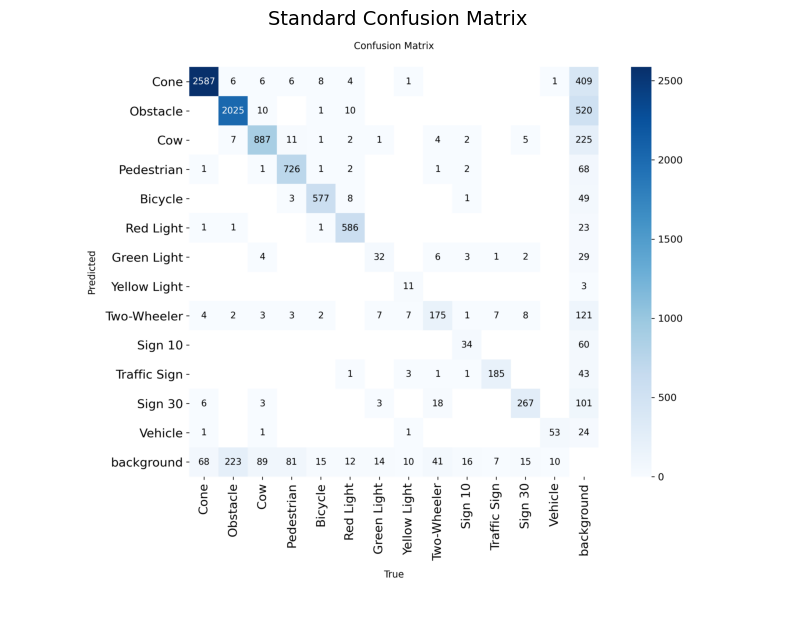

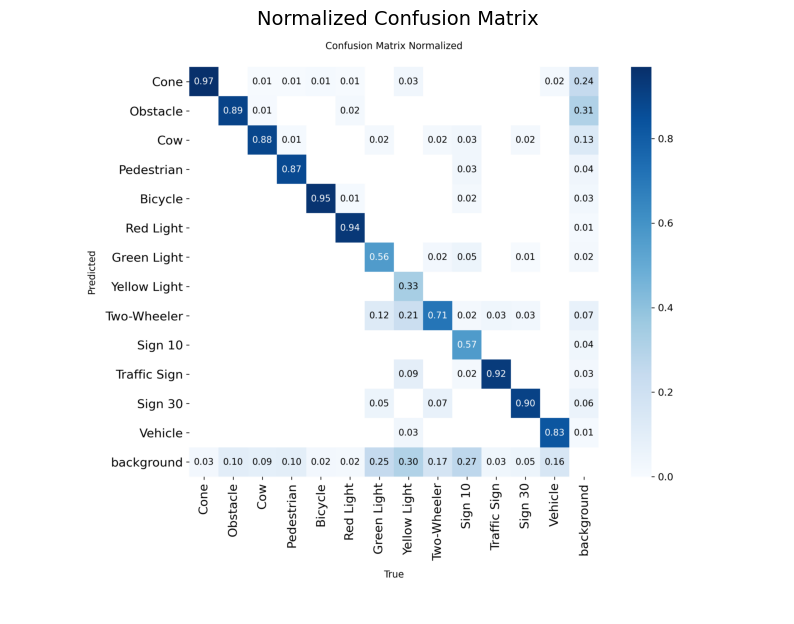


--- PERFORMANCE METRICS ---
File not found: /content/drive/MyDrive/yolo_results/train_run-3/PR_curve.png
File not found: /content/drive/MyDrive/yolo_results/train_run-3/F1_curve.png


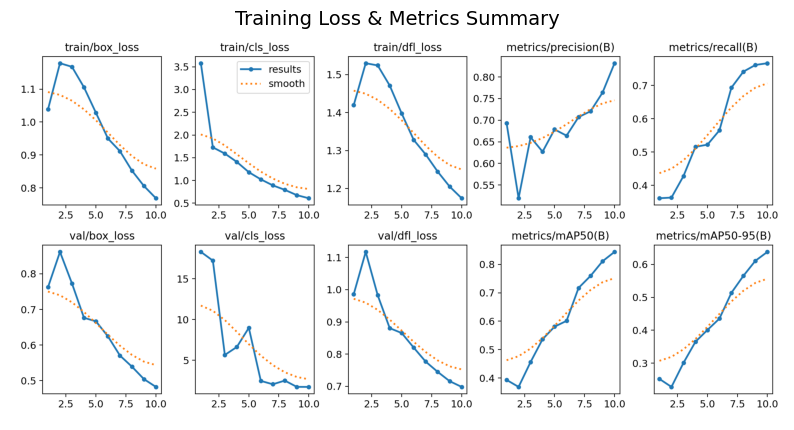


--- PREDICTION VISUALIZATIONS ---


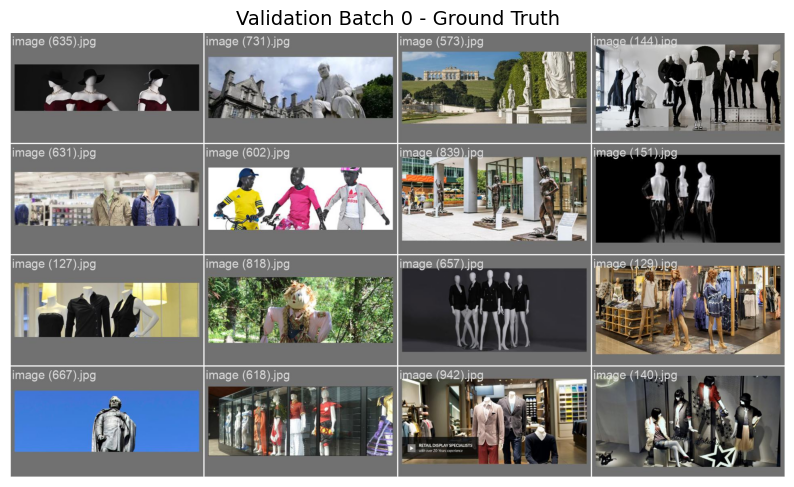

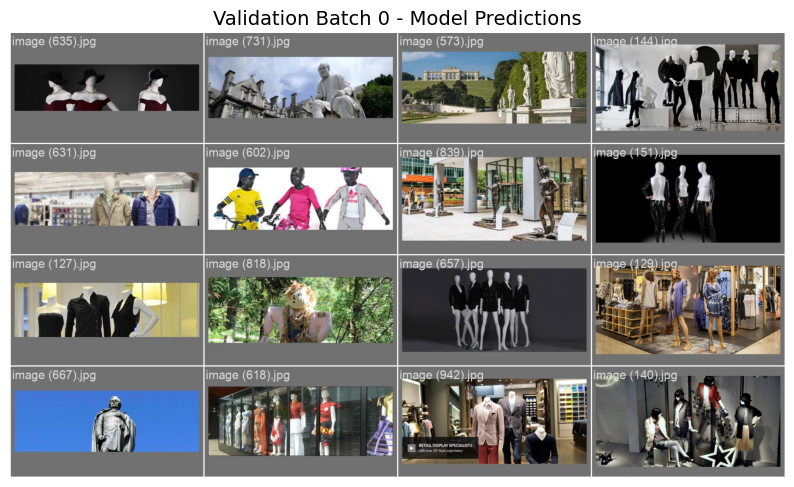

In [19]:
import os
import yaml
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import YOLO

# 1. UNZIP DATASETS FROM DRIVE
!mkdir -p ./data_two_wheeler && unzip -o -q "/content/drive/MyDrive/Two Wheeler.zip" -d ./data_two_wheeler
!mkdir -p ./data_vehicle && unzip -o -q "/content/drive/MyDrive/Vehicle.zip" -d ./data_vehicle
!mkdir -p ./data_bicycle && unzip -o -q "/content/drive/MyDrive/bicycle.zip" -d ./data_bicycle
!mkdir -p ./data_cone && unzip -o -q "/content/drive/MyDrive/cone.zip" -d ./data_cone
!mkdir -p ./data_cow && unzip -o -q "/content/drive/MyDrive/cow.zip" -d ./data_cow
!mkdir -p ./data_green && unzip -o -q "/content/drive/MyDrive/green.zip" -d ./data_green
!mkdir -p ./data_obstacle && unzip -o -q "/content/drive/MyDrive/obstacle.zip" -d ./data_obstacle
!mkdir -p ./data_pedestrian && unzip -o -q "/content/drive/MyDrive/pedestrain det.zip" -d ./data_pedestrian
!mkdir -p ./data_red && unzip -o -q "/content/drive/MyDrive/red light.zip" -d ./data_red
!mkdir -p ./data_sign10 && unzip -o -q "/content/drive/MyDrive/sign10.zip" -d ./data_sign10
!mkdir -p ./data_sign30 && unzip -o -q "/content/drive/MyDrive/sign30.zip" -d ./data_sign30
!mkdir -p ./data_traffic_sign && unzip -o -q "/content/drive/MyDrive/traffic sign.zip" -d ./data_traffic_sign
!mkdir -p ./data_yellow && unzip -o -q "/content/drive/MyDrive/yellow.zip" -d ./data_yellow

print("✅ All datasets unzipped successfully!")

# 2. CREATE COMBINED YAML FILE
DATA_FOLDERS = [
    '/content/data_cone', '/content/data_obstacle', '/content/data_cow',
    '/content/data_pedestrian', '/content/data_bicycle', '/content/data_red',
    '/content/data_green', '/content/data_yellow', '/content/data_two_wheeler',
    '/content/data_sign10', '/content/data_traffic_sign', '/content/data_sign30',
    '/content/data_vehicle'
]

yaml_content = {
    'train': DATA_FOLDERS,
    'val': DATA_FOLDERS,
    'nc': 13,
    'names': [
        'Cone', 'Obstacle', 'Cow', 'Pedestrian', 'Bicycle',
        'Red Light', 'Green Light', 'Yellow Light', 'Two-Wheeler',
        'Sign 10', 'Traffic Sign', 'Sign 30', 'Vehicle'
    ]
}

with open('/content/combined_data.yaml', 'w') as f:
    yaml.dump(yaml_content, f)

print("✅ combined_data.yaml created!")

# 3. TRAIN YOLO MODEL
model = YOLO('yolo11s.pt')
results = model.train(
    data='/content/combined_data.yaml',
    epochs=10,
    imgsz=640,
    project='/content/drive/MyDrive/yolo_results',
    name='train_run',
    plots=True
)

# 4. DISPLAY CONFUSION MATRIX & VISUALIZATIONS
SAVE_DIR = results.save_dir

def show_plot(file_name, title):
    path = os.path.join(SAVE_DIR, file_name)
    if os.path.exists(path):
        img = Image.open(path)
        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.axis('off')
        plt.title(title, fontsize=14)
        plt.show()
    else:
        print(f"File not found: {path}")

print("\n--- CONFUSION MATRICES ---")
show_plot('confusion_matrix.png', 'Standard Confusion Matrix')
show_plot('confusion_matrix_normalized.png', 'Normalized Confusion Matrix')

print("\n--- PERFORMANCE METRICS ---")
show_plot('PR_curve.png', 'Precision-Recall Curve')
show_plot('F1_curve.png', 'F1-Score Curve')
show_plot('results.png', 'Training Loss & Metrics Summary')




0: 640x640 1 airplane, 11.5ms
1: 640x640 (no detections), 11.5ms
2: 640x640 6 cars, 4 traffic lights, 11.5ms
3: 640x640 1 traffic light, 11.5ms
4: 640x640 3 persons, 11.5ms
5: 640x640 (no detections), 11.5ms
6: 640x640 3 persons, 11.5ms
7: 640x640 2 persons, 1 traffic light, 11.5ms
Speed: 0.9ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/predict


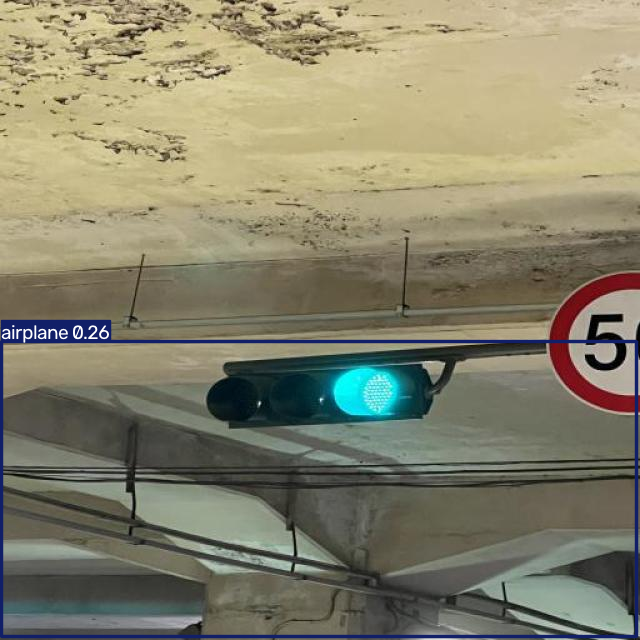

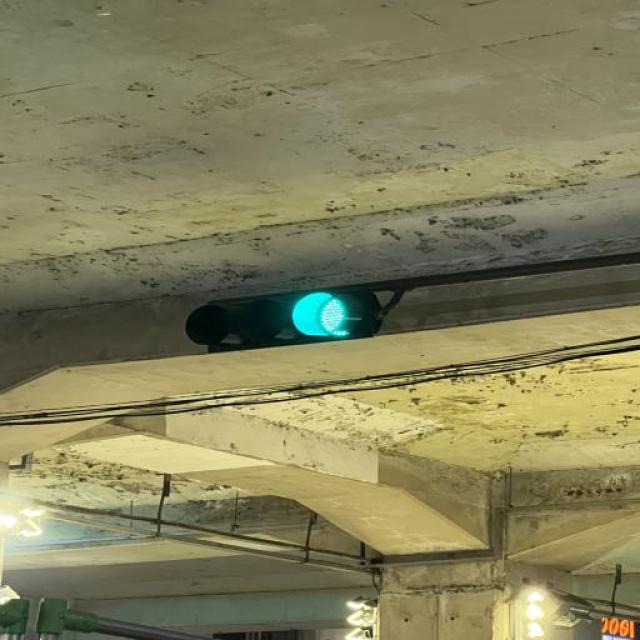

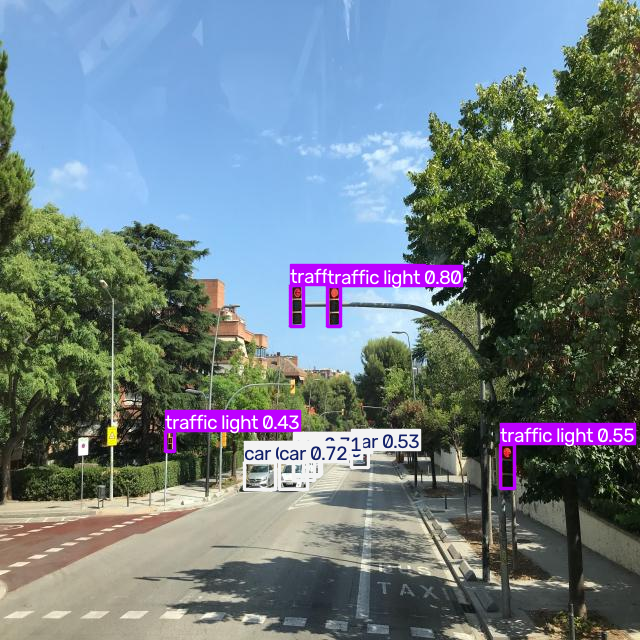

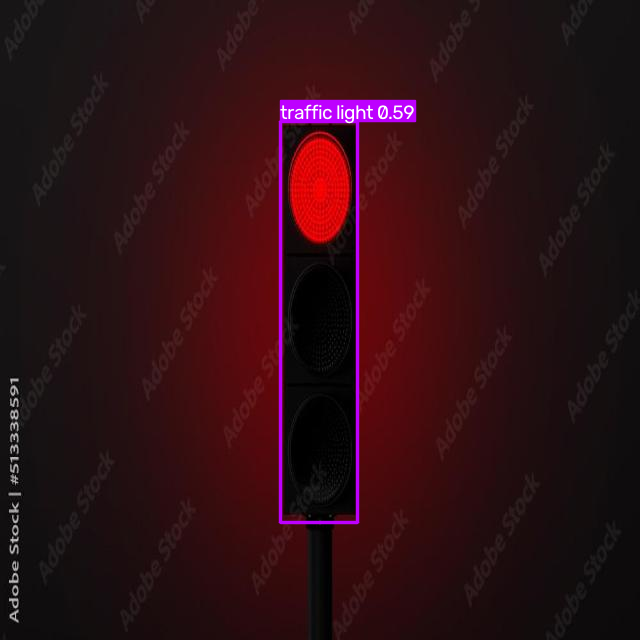

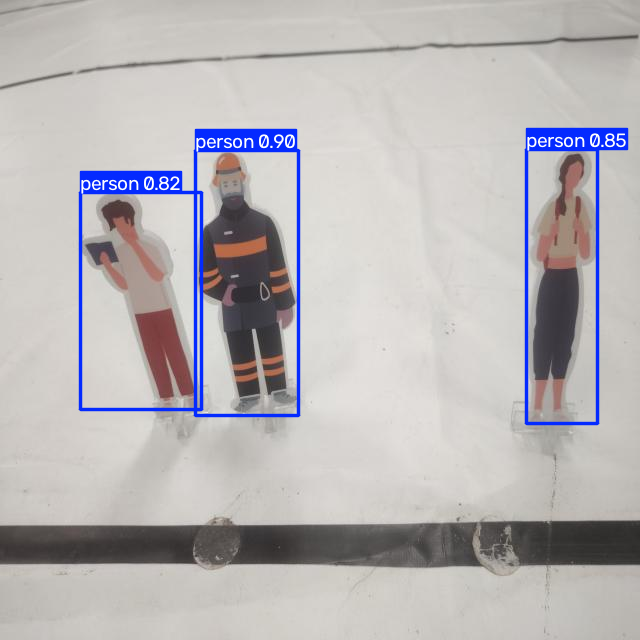

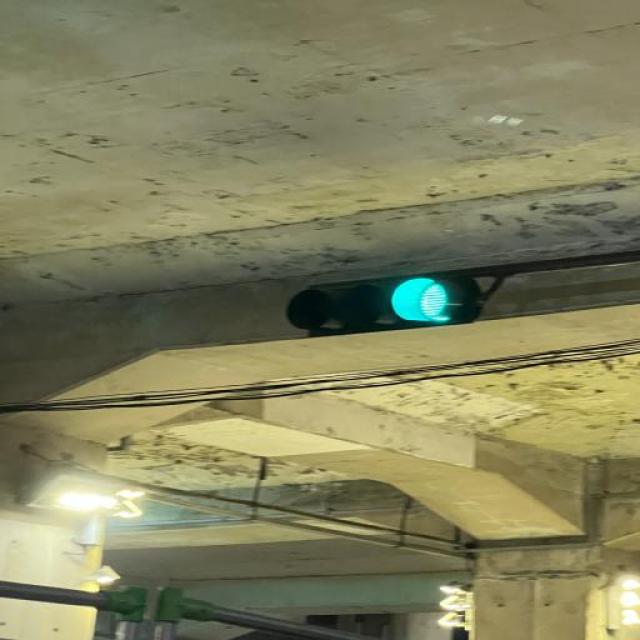

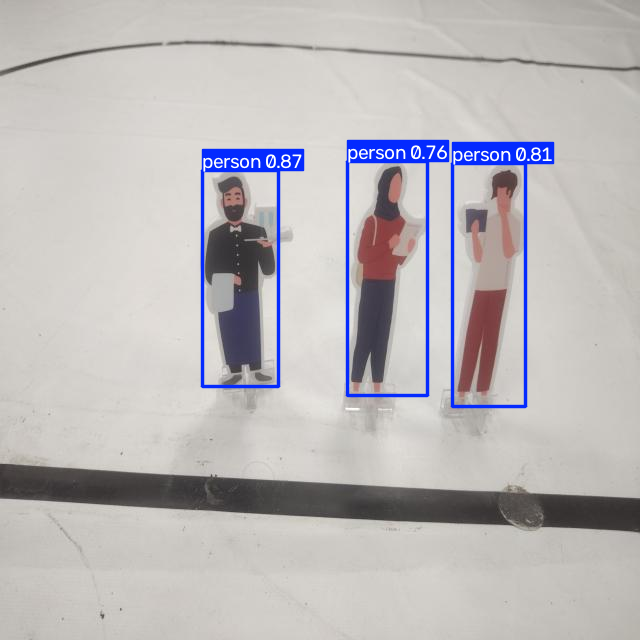

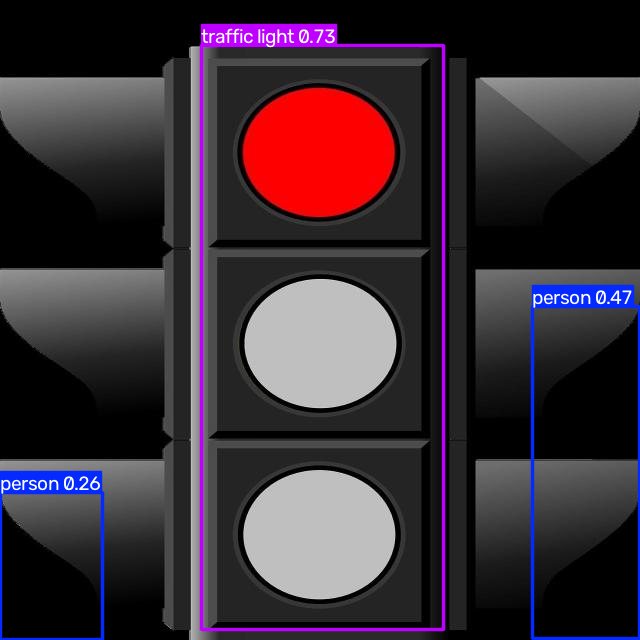

In [21]:
from ultralytics import YOLO
import glob
import os

# Load the base YOLO model weights
model = YOLO("yolo11s.pt")

# Collect images from light-related folders
light_folders = ["./data_red", "./data_green", "./data_yellow"]
image_paths = []
for folder in light_folders:
    image_paths.extend(glob.glob(os.path.join(folder, "**/*.jpg"), recursive=True))

# Run prediction on light images
if image_paths:
    results = model.predict(source=image_paths[:8], imgsz=640, conf=0.25, save=True)

    # Display the results
    for result in results:
        result.show()
else:
    print("No images found in the specified light folders.")

In [22]:
#proper train/validation split logic to fix data leakage and prevent corrupted labels:
import os
import glob
import random
import yaml

DATA_FOLDERS = [
    "./data_cone", "./data_obstacle", "./data_cow",
    "./data_pedestrian", "./data_bicycle", "./data_red",
    "./data_green", "./data_yellow", "./data_two_wheeler",
    "./data_sign10", "./data_traffic", "./data_sign30",
    "./data_vehicle"
]

FOLDER_CLASS_MAP = {
    "./data_cone": 0, "./data_obstacle": 1, "./data_cow": 2,
    "./data_pedestrian": 3, "./data_bicycle": 4, "./data_red": 5,
    "./data_green": 6, "./data_yellow": 7, "./data_two_wheeler": 8,
    "./data_sign10": 9, "./data_traffic": 10, "./data_sign30": 11,
    "./data_vehicle": 12
}

CLASS_NAMES = {
    0: 'Cone', 1: 'Traffic Barrier', 2: 'Cow', 3: 'Pedestrian',
    4: 'Bicyclist', 5: 'Red Traffic Light', 6: 'Green Traffic Light',
    7: 'Orange Traffic Light', 8: 'Two-Wheeler', 9: 'Speed Limit Sign 10',
    10: 'Speed Limit Sign 15', 11: 'Speed Limit Sign 30', 12: 'Cars'
}

# 1. Map labels safely without corrupting multi-line annotations
for folder, target_id in FOLDER_CLASS_MAP.items():
    txt_files = glob.glob(os.path.join(folder, "**/*.txt"), recursive=True)
    for path in txt_files:
        if "data.yaml" in path or "README" in path:
            continue
        with open(path, "r") as f:
            lines = f.readlines()

        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:  # Valid YOLO detection line
                parts[0] = str(target_id)
                new_lines.append(" ".join(parts[:5]))  # Retain standard box coordinates only

        with open(path, "w") as f:
            f.write("\n".join(new_lines) + "\n")

# 2. Collect image paths and split into Train (80%) and Validation (20%)
all_images = []
for folder in DATA_FOLDERS:
    for ext in ("*.jpg", "*.jpeg", "*.png"):
        all_images.extend(glob.glob(os.path.join(folder, f"**/{ext}"), recursive=True))

random.seed(42)
random.shuffle(all_images)

split_idx = int(len(all_images) * 0.8)
train_images = all_images[:split_idx]
val_images = all_images[split_idx:]

# Save split image paths to txt files for Ultralytics parser
with open("train_split.txt", "w") as f:
    f.write("\n".join(train_images))

with open("val_split.txt", "w") as f:
    f.write("\n".join(val_images))

# 3. Build data config pointing to explicit train/val text splits
yaml_content = {
    'path': '/content',
    'train': 'train_split.txt',
    'val': 'val_split.txt',
    'names': CLASS_NAMES
}

with open("combined_data.yaml", "w") as f:
    yaml.dump(yaml_content, f)

print(f"Dataset split complete: {len(train_images)} training images, {len(val_images)} validation images.")

Dataset split complete: 11027 training images, 2757 validation images.


In [24]:
#Dataset Preprocessing & YOLO YAML Generation
import os
import shutil
import random
from pathlib import Path

# 1. Setup Dataset Directory Hierarchy
base_dir = Path("./processed_dataset")
train_img_dir = base_dir / "images/train"
val_img_dir = base_dir / "images/val"
train_lbl_dir = base_dir / "labels/train"
val_lbl_dir = base_dir / "labels/val"

for d in [train_img_dir, val_img_dir, train_lbl_dir, val_lbl_dir]:
    d.mkdir(parents=True, exist_ok=True)

# 2. Define Dataset Sources and Explicit Class Remapping
# Update this dict to map dataset folders to their corresponding class IDs
source_folders = {
    "./data_vehicle": 0,
    "./data_pedestrian": 1,
    "./data_cyclist": 2
}

split_ratio = 0.8  # 80% train, 20% validation

for folder_path, target_class_id in source_folders.items():
    folder = Path(folder_path)
    if not folder.exists():
        continue

    # Collect matching image-label pairs
    image_files = [f for f in folder.glob("*.*") if f.suffix.lower() in [".jpg", ".jpeg", ".png"]]
    random.shuffle(image_files)

    split_idx = int(len(image_files) * split_ratio)

    for idx, img_path in enumerate(image_files):
        label_path = img_path.with_suffix(".txt")
        if not label_path.exists():
            continue

        # Determine train or validation split
        if idx < split_idx:
            dest_img = train_img_dir / img_path.name
            dest_lbl = train_lbl_dir / label_path.name
        else:
            dest_img = val_img_dir / img_path.name
            dest_lbl = val_lbl_dir / label_path.name

        # Copy image file
        shutil.copy(img_path, dest_img)

        # Process and clean label lines
        valid_lines = []
        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            # Ensure line strictly has 5 elements (class_id, x, y, w, h)
            if len(parts) == 5:
                # Assign the target class ID or process preserving multi-class IDs
                parts[0] = str(target_class_id)
                valid_lines.append(" ".join(parts))

        # Write cleaned annotations
        with open(dest_lbl, "w") as f:
            f.write("\n".join(valid_lines) + ("\n" if valid_lines else ""))

# 3. Create Dataset Configuration YAML
data_yaml_content = f"""
path: {base_dir.resolve()}
train: images/train
val: images/val

names:
  0: vehicle
  1: pedestrian
  2: cyclist
"""

yaml_path = base_dir / "data.yaml"
with open(yaml_path, "w") as f:
    f.write(data_yaml_content.strip())

print(f"Dataset prepared successfully at {base_dir.resolve()}")

Dataset prepared successfully at /content/processed_dataset


In [29]:
import glob
import os
from google.colab import files
from ultralytics import YOLO

# Load model and run prediction
model = YOLO("yolo11s.pt")

light_folders = ["./data_red", "./data_green", "./data_yellow"]
image_paths = []
for folder in light_folders:
    image_paths.extend(glob.glob(os.path.join(folder, "**/*.jpg"), recursive=True))

if image_paths:
    # Run prediction and save to a fixed project folder name
    results = model.predict(
        source=image_paths[:20],
        conf=0.25,
        save=True,
        project="/content/my_predictions",
        name="light_results",
        exist_ok=True
    )

    # Zip and download
    !zip -r /content/light_predictions.zip /content/my_predictions/light_results
    files.download('/content/light_predictions.zip')


0: 640x640 1 airplane, 8.9ms
1: 640x640 (no detections), 8.9ms
2: 640x640 6 cars, 4 traffic lights, 8.9ms
3: 640x640 1 traffic light, 8.9ms
4: 640x640 3 persons, 8.9ms
5: 640x640 (no detections), 8.9ms
6: 640x640 3 persons, 8.9ms
7: 640x640 2 persons, 1 traffic light, 8.9ms
8: 640x640 1 traffic light, 8.9ms
9: 640x640 2 traffic lights, 8.9ms
10: 640x640 3 persons, 8.9ms
11: 640x640 2 persons, 8.9ms
12: 640x640 3 persons, 8.9ms
13: 640x640 (no detections), 8.9ms
14: 640x640 3 persons, 8.9ms
15: 640x640 3 persons, 8.9ms
16: 640x640 2 persons, 8.9ms
17: 640x640 1 traffic light, 8.9ms
18: 640x640 3 persons, 8.9ms
19: 640x640 1 traffic light, 8.9ms
Speed: 1.0ms preprocess, 8.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/my_predictions/light_results
  adding: content/my_predictions/light_results/ (stored 0%)
  adding: content/my_predictions/light_results/IMG_4536_jpg.rf.09b11c2806abbffa988ac42282338819.jpg (deflated 5%)
  adding: content/my_p

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>